In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# CSV load
df = pd.read_csv("./Datasets/iris.csv")

# features and target
X = df.drop("Species", axis=1)   # input columns
y = df["Species"]                # only target column

# encode target if it is text
le = LabelEncoder()
y = le.fit_transform(y)

# split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# model
model = GaussianNB()
model.fit(X_train, y_train)

# prediction
y_pred = model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))

Accuracy: 1.0


In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# 1. Load dataset
df = pd.read_csv("./Datasets/spambase.csv")

# 2. Check columns
print(df.columns)
print(df.shape)

# 3. Features and target
X = df.drop("spam", axis=1)
y = df["spam"]   # target column

# 4. Check shapes
print("X shape:", X.shape)
print("y shape:", y.shape)


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 6. Train model
model = GaussianNB()
model.fit(X_train, y_train)

# 7. Predict
y_pred = model.predict(X_test)

# 8. Results
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Index(['word_freq_make', 'word_freq_address', 'word_freq_all', 'word_freq_3d',
       'word_req_our', 'word_freq_over', 'word_freq_remove',
       'word_freq_internet', 'word_freq_order', 'word_freq_mail',
       'word_freq_receive', 'word_freq_will', 'word_freq_people',
       'word_freq_report', 'word_freq_addresses', 'word_freq_free',
       'word_freq_business', 'word_freq_email', 'word_freq_you',
       'word_freq_credit', 'word_freq_your', 'word_freq_font', 'word_freq_000',
       'word_freq_money', 'word_freq_hp', 'word_freq_hpl', 'word_freq_george',
       'word_freq_650', 'word_freq_lab', 'word_freq_labs', 'word_freq_telnet',
       'word_freq_857', 'word_freq_data', 'word_freq_415', 'word_freq_85',
       'word_freq_technology', 'word_freq_1999', 'word_freq_parts',
       'word_freq_pm', 'word_freq_direct', 'word_freq_cs', 'word_freq_meeting',
       'word_freq_original', 'word_freq_project', 'word_freq_re',
       'word_freq_edu', 'word_freq_table', 'word_freq_conference',
 

c:\Users\rajsi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.233e+13, tolerance: 1.563e+11
  model = cd_fast.enet_coordinate_descent(


MSE: 35029707267.716866

All Coefficients:
 id                                      -146880.153891
Date                                        802.432063
number of bedrooms                       -35867.483796
number of bathrooms                       20108.150089
living area                              196224.036667
lot area                                  -9175.380934
number of floors                         -14040.763057
waterfront present                        47163.207372
number of views                           25045.220280
condition of the house                     7513.308737
grade of the house                        60759.880080
Area of the house(excluding basement)    -33553.277515
Area of the basement                     -41681.119274
Built Year                               -46962.410028
Renovation Year                            5946.566240
Postal Code                               20323.095938
Lattitude                                 22191.419741
Longitude            

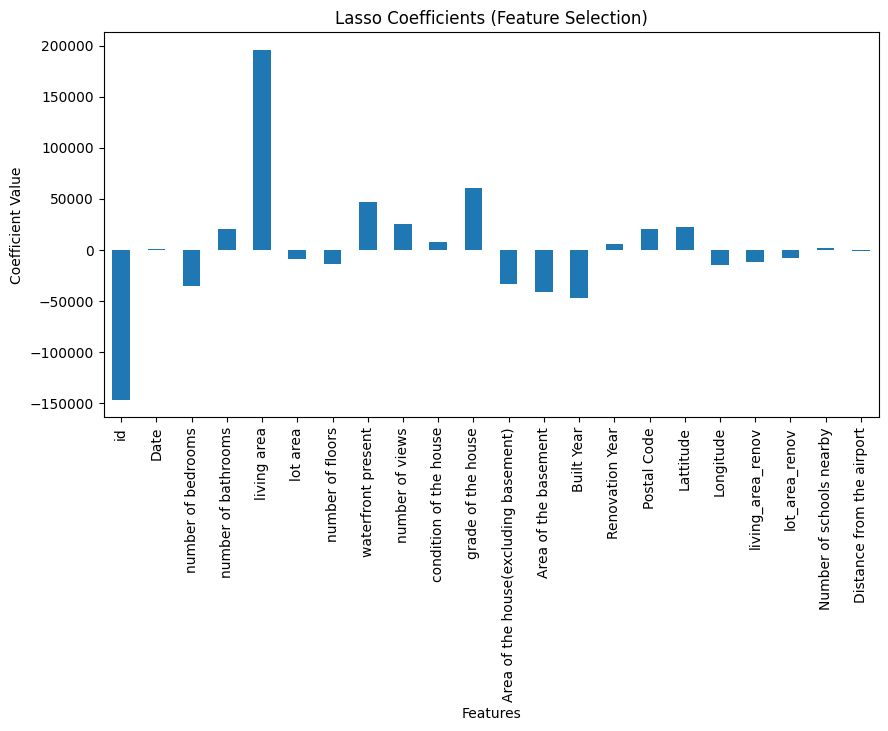

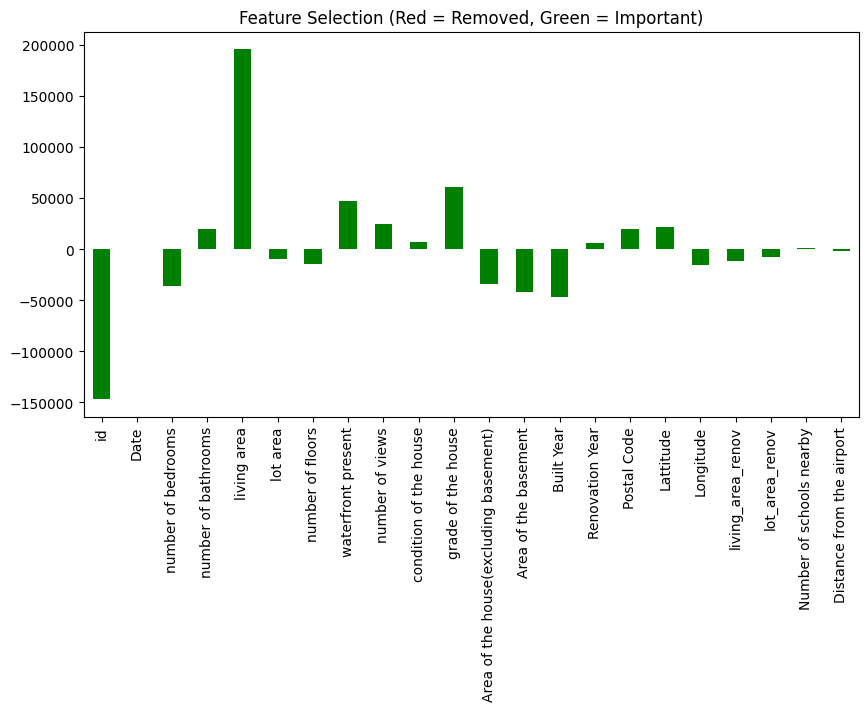

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

# 1. Load dataset
df = pd.read_csv("./Datasets/House Price India.csv")

# 2. Features and target
X = df.iloc[:, :-1]   # all columns except last
y = df.iloc[:, -1]    # target (price)

# 3. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 4. Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 5. Lasso Regression (High alpha for feature selection)
lasso = Lasso(alpha=0.5)
lasso.fit(X_train_scaled, y_train)

# 6. Prediction
y_pred = lasso.predict(X_test_scaled)

# 7. Error
print("MSE:", mean_squared_error(y_test, y_pred))

# 8. Coefficients
coef = pd.Series(lasso.coef_, index=X.columns)
print("\nAll Coefficients:\n", coef)

# 9. Zero coefficients (feature removed)
zero_features = coef[coef == 0]
print("\nFeatures reduced to ZERO:\n", zero_features)

# 10. Important features
important_features = coef[coef != 0]
print("\nImportant Features:\n", important_features)

# ---------------- GRAPH ---------------- #

# 11. Bar graph of coefficients
plt.figure(figsize=(10,5))
coef.plot(kind='bar')
plt.title("Lasso Coefficients (Feature Selection)")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.xticks(rotation=90)
plt.show()

# 12. Highlight zero vs non-zero
plt.figure(figsize=(10,5))
colors = ['red' if c == 0 else 'green' for c in coef]
coef.plot(kind='bar', color=colors)
plt.title("Feature Selection (Red = Removed, Green = Important)")
plt.xticks(rotation=90)
plt.show()

Accuracy: 0.8208469055374593

Confusion Matrix:
 [[387 144]
 [ 21 369]]

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.73      0.82       531
           1       0.72      0.95      0.82       390

    accuracy                           0.82       921
   macro avg       0.83      0.84      0.82       921
weighted avg       0.85      0.82      0.82       921



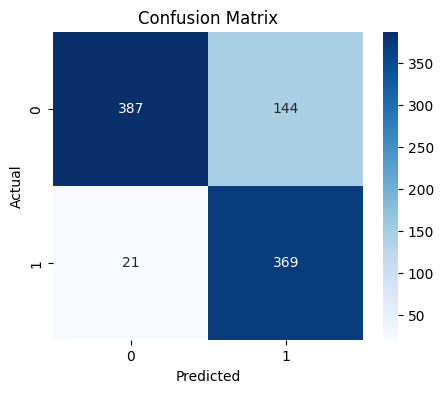

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# 1. Load dataset
df = pd.read_csv("./Datasets/spambase.csv")

# 2. Features and target
X = df.iloc[:, :-1]   # safe selection
y = df.iloc[:, -1]

# 3. Pairplot (sample use karo warna heavy hoga)
sample_df = df.sample(200, random_state=42)
sns.pairplot(sample_df, hue=sample_df.columns[-1])
plt.show()

# 4. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 5. Model
model = GaussianNB()
model.fit(X_train, y_train)

# 6. Prediction
y_pred = model.predict(X_test)

# 7. Accuracy
print("Accuracy:", accuracy_score(y_test, y_pred))

# 8. Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:\n", cm)

# 9. Classification Report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# 10. Confusion Matrix Graph
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

df =pd.read_csv("./Datasets/House Price India.csv")

c:\Users\rajsi\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:716: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.233e+13, tolerance: 1.563e+11
  model = cd_fast.enet_coordinate_descent(


MSE: 35029707267.716866

All Coefficients:
 id                                      -146880.153891
Date                                        802.432063
number of bedrooms                       -35867.483796
number of bathrooms                       20108.150089
living area                              196224.036667
lot area                                  -9175.380934
number of floors                         -14040.763057
waterfront present                        47163.207372
number of views                           25045.220280
condition of the house                     7513.308737
grade of the house                        60759.880080
Area of the house(excluding basement)    -33553.277515
Area of the basement                     -41681.119274
Built Year                               -46962.410028
Renovation Year                            5946.566240
Postal Code                               20323.095938
Lattitude                                 22191.419741
Longitude            

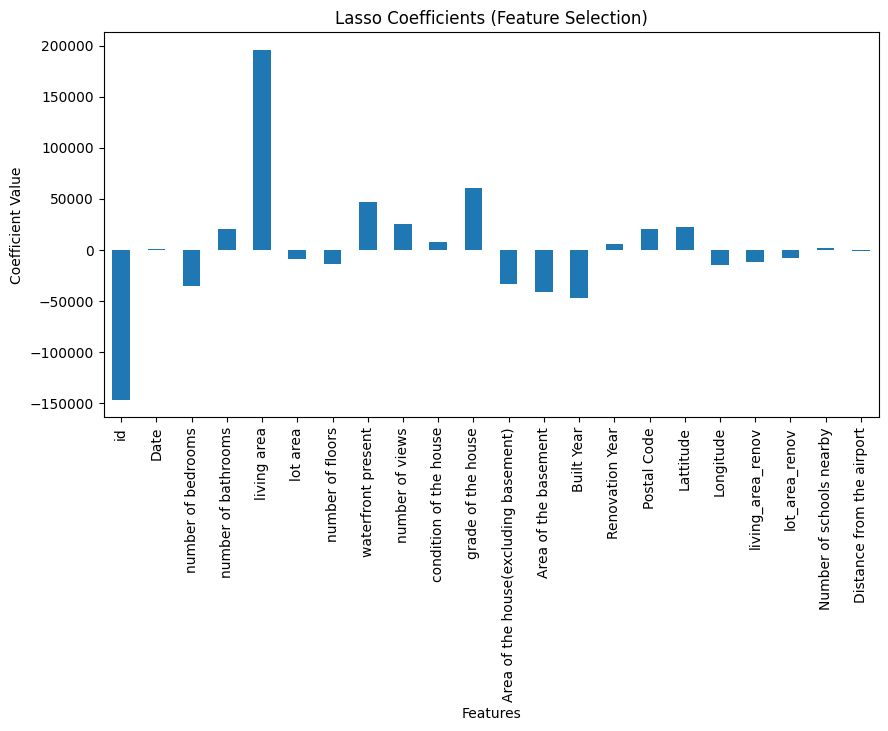

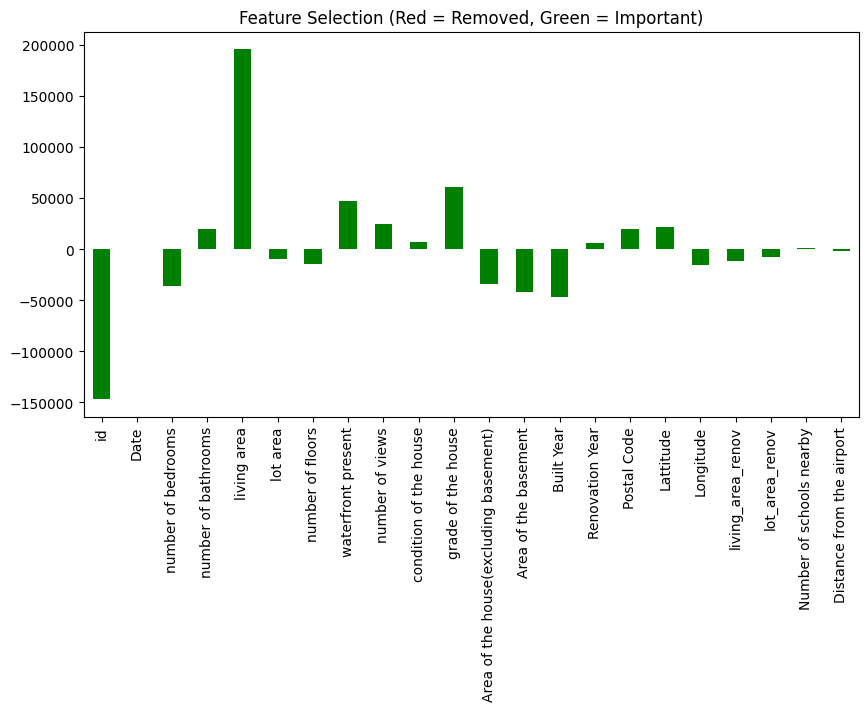

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

# 1. Load dataset

df =pd.read_csv("./Datasets/House Price India.csv")

# 2. Features and target
X = df.iloc[:, :-1]   # all columns except last
y = df.iloc[:, -1]    # target (price)

# 3. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 4. Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 5. Lasso Regression (High alpha for feature selection)
lasso = Lasso(alpha=0.5)
lasso.fit(X_train_scaled, y_train)

# 6. Prediction
y_pred = lasso.predict(X_test_scaled)

# 7. Error
print("MSE:", mean_squared_error(y_test, y_pred))

# 8. Coefficients
coef = pd.Series(lasso.coef_, index=X.columns)
print("\nAll Coefficients:\n", coef)

# 9. Zero coefficients (feature removed)
zero_features = coef[coef == 0]
print("\nFeatures reduced to ZERO:\n", zero_features)

# 10. Important features
important_features = coef[coef != 0]
print("\nImportant Features:\n", important_features)

# ---------------- GRAPH ---------------- #

# 11. Bar graph of coefficients
plt.figure(figsize=(10,5))
coef.plot(kind='bar')
plt.title("Lasso Coefficients (Feature Selection)")
plt.xlabel("Features")
plt.ylabel("Coefficient Value")
plt.xticks(rotation=90)
plt.show()

# 12. Highlight zero vs non-zero
plt.figure(figsize=(10,5))
colors = ['red' if c == 0 else 'green' for c in coef]
coef.plot(kind='bar', color=colors)
plt.title("Feature Selection (Red = Removed, Green = Important)")
plt.xticks(rotation=90)
plt.show()

Accuracy: 1.0

Confusion Matrix:
 [[10  0  0]
 [ 0  9  0]
 [ 0  0 11]]

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         9
           2       1.00      1.00      1.00        11

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



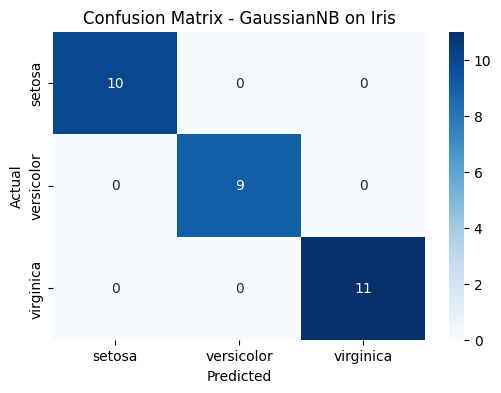

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# 1. Load dataset
df = pd.read_csv("./Datasets/iris.csv")

# 2. Features and target
X = df.iloc[:, :-1]
y = df.iloc[:, -1]

# 3. Encode target
le = LabelEncoder()
y = le.fit_transform(y)

# 4. Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 5. Model
model = GaussianNB()
model.fit(X_train, y_train)

# 6. Prediction
y_pred = model.predict(X_test)

# 7. Accuracy
print("Accuracy:", accuracy_score(y_test, y_pred))

# 8. Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:\n", cm)

# 9. Classification Report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# 10. Graph - Confusion Matrix Heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - GaussianNB on Iris")
plt.show()